In [2]:
# Todo - check variable Cluster-ss-sp / looks created to late
# todo - create plotly templates


In [3]:
#import librairies

import pandas as pd
import numpy as np
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans, SpectralClustering
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score

import plotly.graph_objects as go
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

In [4]:
#these are intersting libraries

#from pandas_profiling import ProfileReport
#from heatmap import heatmap, corrplot

In [5]:
# using Jeffrey's Helpers to filter dataframes 

def helper_has_fields_compared_to(df, columns, target, what, operator):
   
    #Helper to compare several columns to the same value.

    col = columns[0]
    if operator == '>':
        res = (df[col] > target)
    elif operator == '>=':
        res = (df[col] >= target)
    elif operator == '<=':
        res = (df[col] <= target)
    elif operator == '<':
        res = (df[col] < target)
    elif operator == '==':
        res = (df[col] == target)
    elif operator == '!=':
        res = (df[col] != target)  
    for col in columns[1:]:
        if operator == '>':
            tmp = (df[col] > target)
        elif operator == '>=':
            tmp = (df[col] >= target)
        elif operator == '<=':
            tmp = (df[col] <= target)
        elif operator == '<':
            tmp = (df[col] < target)
        elif operator == '==':
            tmp = (df[col] == target)
        elif operator == '!=':
            tmp = (df[col] != target)
        if what == 'all':
            res = res & tmp
        elif what in ['any']:
            res = res | tmp
    return res

def helper_has_any_field_greater_than(df, columns, target):
    #Returns lines of the dataframe where any of value of the specified columns is greater than the target.
    res = helper_has_fields_compared_to(df, columns, target, 'any', '>')
    return res

def helper_has_any_field_smaller_than(df, columns, target):
    #Returns lines of the dataframe where any of value of the specified columns is smaller than the target.
    res = helper_has_fields_compared_to(df, columns, target, 'any', '<')
    return res

def helper_has_all_field_greater_than(df, columns, target):
    #Returns lines of the dataframe where all of value of the specified columns is smaller than the target.
    res = helper_has_fields_compared_to(df, columns, target, 'all', '>')
    return res

def helper_has_all_field_smaller_than(df, columns, target):
    #Returns lines of the dataframe where all of value of the specified columns is smaller than the target.
    res = helper_has_fields_compared_to(df, columns, target, 'all', '<')
    return res

def helper_has_all_field_equal_to(df, columns, target):
    #Returns lines of the dataframe where all of value of the specified columns is equal to the target.
    res = helper_has_fields_compared_to(df, columns, target, 'all', '==')
    return res

# Data check and clean

In [6]:
# Loading the data
raw_data=pd.read_csv('raw-data.csv')
# Printing data insights
raw_data.info()
raw_data.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98913 entries, 0 to 98912
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   identifierHash       98913 non-null  int64  
 1   type                 98913 non-null  object 
 2   country              98913 non-null  object 
 3   language             98913 non-null  object 
 4   socialNbFollowers    98913 non-null  int64  
 5   socialNbFollows      98913 non-null  int64  
 6   socialProductsLiked  98913 non-null  int64  
 7   productsListed       98913 non-null  int64  
 8   productsSold         98913 non-null  int64  
 9   productsPassRate     98913 non-null  float64
 10  productsWished       98913 non-null  int64  
 11  productsBought       98913 non-null  int64  
 12  gender               98913 non-null  object 
 13  civilityGenderId     98913 non-null  int64  
 14  civilityTitle        98913 non-null  object 
 15  hasAnyApp            98913 non-null 

,identifierHash,type,country,language,socialNbFollowers,socialNbFollows,socialProductsLiked,productsListed,productsSold,productsPassRate,...,civilityTitle,hasAnyApp,hasAndroidApp,hasIosApp,hasProfilePicture,daysSinceLastLogin,seniority,seniorityAsMonths,seniorityAsYears,countryCode
0,-1097895247965112460,user,Royaume-Uni,en,147,10,77,26,174,74.0,...,mr,True,False,True,True,11,3196,106.53,8.88,gb
1,2347567364561867620,user,Monaco,en,167,8,2,19,170,99.0,...,mrs,True,False,True,True,12,3204,106.80,8.90,mc
2,6870940546848049750,user,France,fr,137,13,60,33,163,94.0,...,mrs,True,False,True,False,11,3203,106.77,8.90,fr
3,-4640272621319568052,user,Etats-Unis,en,131,10,14,122,152,92.0,...,mrs,True,False,True,False,12,3198,106.60,8.88,us
4,-5175830994878542658,user,Etats-Unis,en,167,8,0,25,125,100.0,...,mrs,False,False,False,True,22,2854,95.13,7.93,us


In [7]:
#checking if there is any missing value
raw_data.isna().sum()

identifierHash         0
type                   0
country                0
language               0
socialNbFollowers      0
socialNbFollows        0
socialProductsLiked    0
productsListed         0
productsSold           0
productsPassRate       0
productsWished         0
productsBought         0
gender                 0
civilityGenderId       0
civilityTitle          0
hasAnyApp              0
hasAndroidApp          0
hasIosApp              0
hasProfilePicture      0
daysSinceLastLogin     0
seniority              0
seniorityAsMonths      0
seniorityAsYears       0
countryCode            0
dtype: int64

the dataset is clean, has no nan or missing data. We are good to go
As such, we will remove columns socio-demo columns to focus on the interactions aspect

In [8]:
##cleaning columns
df1 = raw_data
del df1['type']
del df1['seniorityAsMonths']
del df1['seniorityAsYears']
del df1['country']
del df1['identifierHash']
df1.head(5)

,language,socialNbFollowers,socialNbFollows,socialProductsLiked,productsListed,productsSold,productsPassRate,productsWished,productsBought,gender,civilityGenderId,civilityTitle,hasAnyApp,hasAndroidApp,hasIosApp,hasProfilePicture,daysSinceLastLogin,seniority,countryCode
0,en,147,10,77,26,174,74.0,104,1,M,1,mr,True,False,True,True,11,3196,gb
1,en,167,8,2,19,170,99.0,0,0,F,2,mrs,True,False,True,True,12,3204,mc
2,fr,137,13,60,33,163,94.0,10,3,F,2,mrs,True,False,True,False,11,3203,fr
3,en,131,10,14,122,152,92.0,7,0,F,2,mrs,True,False,True,False,12,3198,us
4,en,167,8,0,25,125,100.0,0,0,F,2,mrs,False,False,False,True,22,2854,us


In [9]:
#corrdf

corr_df = df1
del corr_df['hasAnyApp']
del corr_df['hasAndroidApp']
del corr_df['hasIosApp']
del corr_df['hasProfilePicture']
del corr_df['civilityGenderId']
del corr_df['daysSinceLastLogin']
del corr_df['seniority']
del corr_df['civilityTitle']
del corr_df['gender']
del corr_df['countryCode']
corr_df.head(2)

,language,socialNbFollowers,socialNbFollows,socialProductsLiked,productsListed,productsSold,productsPassRate,productsWished,productsBought
0,en,147,10,77,26,174,74.0,104,1
1,en,167,8,2,19,170,99.0,0,0


In [10]:
#Doing a quick EDA 
#profile = ProfileReport(corr_df, title='QUick EDA on vestiairecollective.com', explorative=True)
#profile.to_file("quick_eda.html")

# Edited out because of pandaprofiing

The data is highly skewd. Especially with the social features. Could mean that there are superusers or loads of inactives.

# Segmention of users

## Active/inactive users
An active user is defined as having a value supeiror to 0 in the following fields. An inactive user is inferior to 1

- socialProductsLiked
- productsListed
- productsPassRate
- productsWished
- productsSold
- productsBought

In [11]:
#Inacrive users
inactive_usr=corr_df[helper_has_all_field_smaller_than(corr_df,['socialProductsLiked', 'productsListed',
      'productsPassRate', 'productsWished', 'productsListed','productsSold','productsBought'],1)]
# ACTIVE USERS
active_usr=corr_df[helper_has_any_field_greater_than(corr_df,['socialProductsLiked', 'productsListed',
      'productsPassRate', 'productsWished', 'productsSold','productsBought'],0)]

## Buyers / Sellers

Buyers are defined as having bought more than 0 item

Potential sellers are people who have either listed more than 0 item OR sold more than 0

Successful sellers have solds more than 0 item

In [12]:
buyers_df = corr_df[corr_df.productsBought > 0]


## POTENTIAL SELLERS (has listed more than 0 product OR has sold more than 0 product)
potential_sellers = corr_df[(corr_df.productsListed > 0) | (corr_df.productsSold > 0)]

## ACUTAL SELLER  (at least 1 product sold)
successful_sellers = corr_df[corr_df.productsSold > 0]

## social users

In [13]:
# SOCIAL USERS

# Each new account is automatically assigned 3 followers and 8 accounts to follow
# Filtering out those who differ from these default account settings.
social_df = corr_df[ (corr_df['socialNbFollowers'] != 3) | (corr_df['socialNbFollows'] != 8) ]

# MARKET SOCIAL
# Among those social users, filter only those active on products (selling, buying or wishing for articles, ...)

social_df1=social_df[helper_has_any_field_greater_than(social_df,['productsSold','productsBought'],0)]
##
market_social_df = social_df1[helper_has_any_field_greater_than(social_df, ['socialProductsLiked', 'productsListed', 'productsSold',
       'productsPassRate', 'productsWished', 'productsBought'], 0)]



AActive_db = corr_df[helper_has_any_field_greater_than(corr_df,['socialProductsLiked', 'productsListed',
       'productsPassRate', 'productsWished'], 0)]

# Some quick math

In [14]:
print(f"Actual Users: {active_usr.shape[0]} ")
print(f"Actal Active Users: {AActive_db.shape[0]}")
print("Actual buyers: ", buyers_df.shape[0])
print("Prospecting sellers: ",potential_sellers.shape[0])
print("Actual sellers: ", successful_sellers.shape[0])
print(f"Potential Social Users: {market_social_df.shape[0]}")

Actual Users: 21639 
Actal Active Users: 19640
Actual buyers:  5419
Prospecting sellers:  2719
Actual sellers:  2036
Potential Social Users: 4622


In [15]:
# for the lulz
### RESULTS / INFO
print(f"""Out of the {df1.shape[0]} users of the dataset sample, there are:""")
print()
print(f"""- {active_usr.shape[0]} active users ({100*active_usr.shape[0]/df1.shape[0]:.3}%). Among these prospective buyers and sellers""")

print(f"""  - {active_usr.shape[0] - potential_sellers.shape[0]} are prospective buyers""")
print(f"""    among which {buyers_df.shape[0]} people actually bought products (at least 1)""")
print(f"""  - {potential_sellers.shape[0]} are prospective sellers""")
print(f"""    among which {successful_sellers.shape[0]} are successful sellers (sold more than 1 product)""")
print()
print(f"""- {social_df.shape[0]} people ({100*social_df.shape[0]/df1.shape[0]:.3}%) modified their social network features and can be considered socially active""")

print("\nNote that among the above number of sellers, some may act as buyers and vice-versa")

Out of the 98913 users of the dataset sample, there are:

- 21639 active users (21.9%). Among these prospective buyers and sellers
  - 18920 are prospective buyers
    among which 5419 people actually bought products (at least 1)
  - 2719 are prospective sellers
    among which 2036 are successful sellers (sold more than 1 product)

- 15595 people (15.8%) modified their social network features and can be considered socially active

Note that among the above number of sellers, some may act as buyers and vice-versa


In [16]:
print(f"""On average, buyers buy {buyers_df.productsBought.sum() / buyers_df.shape[0] :.2f} products. Details are as follows:""")

buyer_avg = buyers_df.productsBought.sum() / buyers_df.shape[0] 
#super buyers
Sbuyers_db = corr_df[corr_df.productsBought >= 3]
Sbuyers_db.dataframeName = "SBuyers"
print("Accordingly, Successful buyers: ", Sbuyers_db.shape[0])
buyers_df.productsBought.describe()


On average, buyers buy 3.14 products. Details are as follows:
Accordingly, Successful buyers:  1277


count    5419.000000
mean        3.138217
std         9.486478
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max       405.000000
Name: productsBought, dtype: float64

In [23]:
fig = px.histogram(buyers_df, x="productsBought")

fig.update_traces(xbins=dict( # bins used for histogram
        start=0.0,
        end=30.0,
        size=1
    
    ))
fig.update_layout(
    title={
        'text': "Histogram of the distribution of the number of product bought",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title="Amount of users",
)
#TODO orca package issue, can't output stuff.
fig.write_image("Output/fig1.png")
fig.show()


ValueError: 
The orca executable is required to export figures as static images,
but it could not be found on the system path.

Searched for executable 'orca' on the following path:
    C:\Users\sam\Anaconda3
    C:\Users\sam\Anaconda3\Library\mingw-w64\bin
    C:\Users\sam\Anaconda3\Library\usr\bin
    C:\Users\sam\Anaconda3\Library\bin
    C:\Users\sam\Anaconda3\Scripts
    C:\Users\sam\Anaconda3\bin
    C:\Users\sam\Anaconda3\condabin
    C:\Python38\Scripts
    C:\Python38
    C:\Program Files (x86)\Common Files\Oracle\Java\javapath
    C:\ProgramData\Oracle\Java\javapath
    C:\Windows\system32
    C:\Windows
    C:\Windows\System32\Wbem
    C:\Windows\System32\WindowsPowerShell\v1.0
    C:\Program Files (x86)\NVIDIA Corporation\PhysX\Common
    C:\WINDOWS\system32
    C:\WINDOWS
    C:\WINDOWS\System32\Wbem
    C:\WINDOWS\System32\WindowsPowerShell\v1.0
    C:\WINDOWS\System32\OpenSSH
    C:\Program Files\PuTTY
    C:\Program Files\NVIDIA Corporation\NVIDIA NvDLISR
    C:\WINDOWS\system32
    C:\WINDOWS
    C:\WINDOWS\System32\Wbem
    C:\WINDOWS\System32\WindowsPowerShell\v1.0
    C:\WINDOWS\System32\OpenSSH
    C:\Program Files\nodejs
    C:\ProgramData\chocolatey\bin
    C:\Program Files\Git\cmd
    C:\Program Files\dotnet
    C:\Users\sam\AppData\Local\Microsoft\WindowsApps
    C:\Users\sam\AppData\Local\GitHubDesktop\bin
    C:\Users\sam\AppData\Roaming\npm
    C:\Users\sam\AppData\Local\Microsoft\WindowsApps
    C:\Users\sam\AppData\Local\Pandoc
    C:\Users\sam\Anaconda3\Library\Bin
    C:\Users\sam\Anaconda3\lib\site-packages\scipy\.libs

If you haven't installed orca yet, you can do so using conda as follows:

    $ conda install -c plotly plotly-orca

Alternatively, see other installation methods in the orca project README at
https://github.com/plotly/orca

After installation is complete, no further configuration should be needed.

If you have installed orca, then for some reason plotly.py was unable to
locate it. In this case, set the `plotly.io.orca.config.executable`
property to the full path of your orca executable. For example:

    >>> plotly.io.orca.config.executable = '/path/to/orca'

After updating this executable property, try the export operation again.
If it is successful then you may want to save this configuration so that it
will be applied automatically in future sessions. You can do this as follows:

    >>> plotly.io.orca.config.save()

If you're still having trouble, feel free to ask for help on the forums at
https://community.plot.ly/c/api/python


In [24]:
fig = px.histogram(successful_sellers, x="productsSold")

fig.update_traces(xbins=dict( # bins used for histogram
        start=0.0,
        end=30.0,
        size=1
    
    ))
fig.update_layout(
    title={
        'text': "Histogram of the distribution of the number of product sold",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title="Amount of users",
)
#todo 
#fig.write_image("Output/fig2.png")
fig.show()

In [25]:
print(f"""On average, actual sellers sell {successful_sellers.productsSold.sum() / successful_sellers.shape[0] :.2f} products. Details are as follows:""")
#successful sellers
Ssellers_df = corr_df[corr_df.productsSold >= 6]

print("there are the follwing amout of supers sellers (>6): ", Ssellers_df.shape[0])
successful_sellers.productsSold.describe()


On average, actual sellers sell 5.91 products. Details are as follows:
there are the follwing amout of supers sellers (>6):  458


count    2036.000000
mean        5.907171
std        13.626529
min         1.000000
25%         1.000000
50%         2.000000
75%         5.000000
max       174.000000
Name: productsSold, dtype: float64

In [26]:
print(f"""On average, actual sellers have {successful_sellers.socialNbFollowers.sum() / successful_sellers.shape[0] :.2f} followers. Details are as follows:""")

successful_sellers.socialNbFollowers.describe()

On average, actual sellers have 11.85 followers. Details are as follows:


count    2036.000000
mean       11.848723
std        24.246375
min         3.000000
25%         4.000000
50%         6.000000
75%        11.000000
max       744.000000
Name: socialNbFollowers, dtype: float64

The high STD shows that data is highly skewd. The might be some outliers.

In [27]:
#todo Cluster-ss-sp is created way below
fig = px.violin(successful_sellers, y="socialNbFollowers",box=True, color ='Cluster-ss-sp', color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"], # draw box plot inside the violin
                points='all')
fig.update_layout(
    title={
        'text': "A violin plot of the number of social followers per cluster",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

ValueError: Value of 'color' is not the name of a column in 'data_frame'. Expected one of ['language', 'socialNbFollowers', 'socialNbFollows', 'socialProductsLiked', 'productsListed', 'productsSold', 'productsPassRate', 'productsWished', 'productsBought'] but received: Cluster-ss-sp

In [28]:
#this adds columns to define and assign whether a user is active/buyins/selling

map_df = corr_df

#translating the defintions above in a Y/N column 


#active
map_df.loc[(map_df['socialProductsLiked'] <1) & (map_df['productsListed'] <1) & (map_df['productsPassRate'] <1) & (map_df['productsWished'] <1) & (map_df['productsListed'] <1) & (map_df['productsSold'] <1) & (map_df['productsBought'] <1),'A_user'] = 'inactive'
map_df.loc[(map_df['socialProductsLiked'] >0) |(map_df['productsListed'] >0) | (map_df['productsPassRate'] >0) | (map_df['productsWished'] >0) | (map_df['productsListed'] >0) | (map_df['productsSold'] >0) | (map_df['productsBought'] >=1),'A_user'] = 'active'


#social buyers
map_df.loc[(map_df['socialNbFollowers'] != 3) | (map_df['socialNbFollows'] != 8), 'Social use'] = 'social user'  
map_df.loc[(map_df['socialNbFollowers'] == 3) & (map_df['socialNbFollows'] == 8), 'Social use'] = 'non social user' 
#buyers
map_df['Buyer'] =map_df['productsBought'].apply(lambda x: 'Non buyer' if x == 0 else 'Buyer')
#sellers
map_df['seller'] =map_df['productsSold'].apply(lambda x: 'Non seller' if x == 0 else 'seller')

map_df["Users"] = "Users" # in order to have a single root node

In [29]:
df = map_df

fig = px.parallel_categories(df, dimensions=['Users', 'A_user', 'Buyer', 'Social use'],
#                             color ="productsBought"
                            )
fig.update_layout(
    title={
        'text': "Distribution of users",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

In [30]:
fig = px.treemap(map_df, path=['Users', 'A_user', 'seller', 'Social use'],
#                  color='productsBought',
                  color_continuous_scale='RdBu'
                  #color_continuous_midpoint=np.average(map_df['productsSold'], weights=map_df['productsPassRate'])
                )
fig.update_layout(
    title={
        'text': "A represenation of the users segmentation and its segments",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
#todo orca
#fig.write_image("Output/fig3.png")
fig.show()

In [31]:
fig = px.treemap(map_df, path=['Users', 'A_user', 'seller', 'Social use'],
                  color='productsBought',
                  color_continuous_scale='RdBu'
                  #color_continuous_midpoint=np.average(map_df['productsSold'], weights=map_df['productsPassRate'])
                )
fig.update_layout(
    title={
        'text': "A represenation of the users segmentation and its segments",
        'y':0.99,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
#todo orca
#fig.write_image("Output/fig4.png")
fig.show()

In [32]:
fig = px.sunburst(map_df,  path=['Users', 'A_user', 'Buyer', 'Social use']
                 )
fig.show()

# Finding correlation 

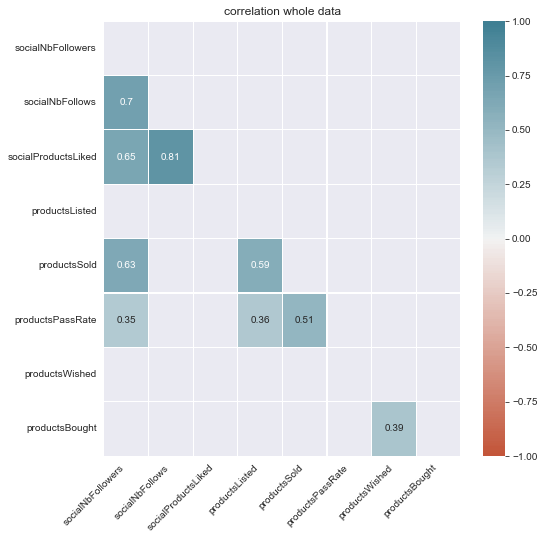

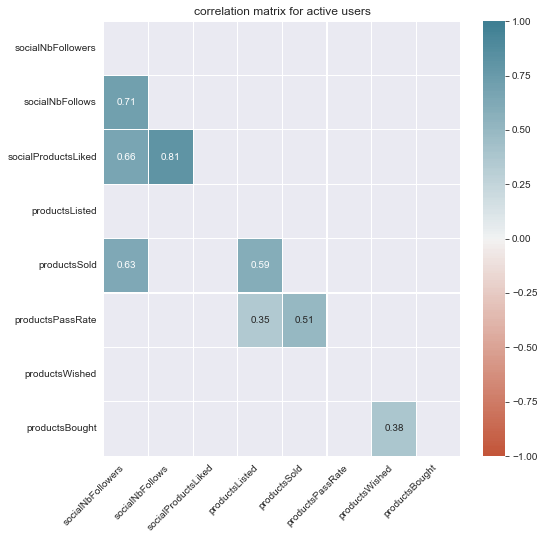

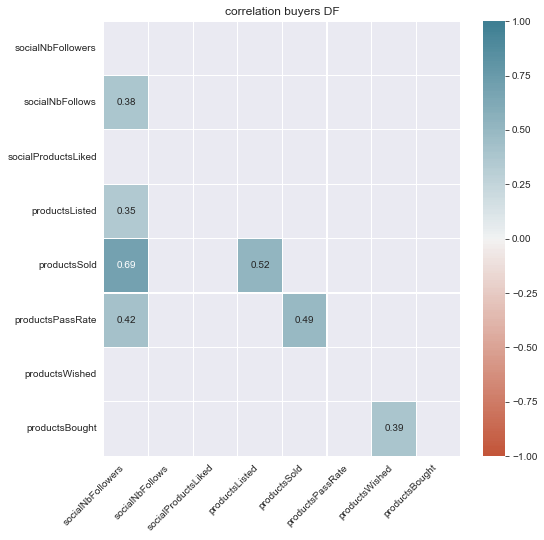

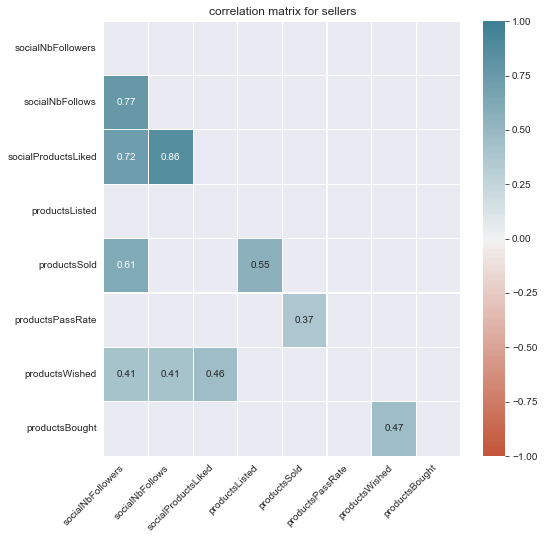

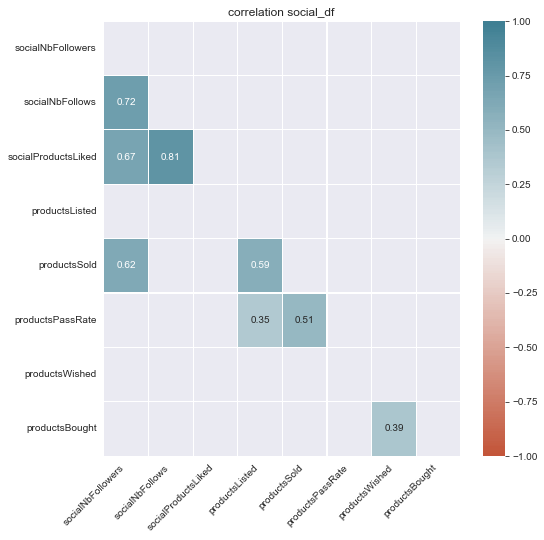

In [33]:
plt.figure(figsize = (8,8))
plt.title('correlation whole data')
corr = corr_df.corr()
matrix = np.triu(corr)
ax = sns.heatmap(
    corr[(corr >= 0.35) | (corr <= -0.5)], 
    vmin=-1, vmax=1, center=0, linewidths=0.1,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=False,
    annot=True,
    annot_kws={"size": 10},
    mask=matrix
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

##

plt.figure(figsize = (8,8))
plt.title('correlation matrix for active users')
corr = active_usr.corr()
matrix = np.triu(corr)
ax = sns.heatmap(
    corr[(corr >= 0.35) | (corr <= -0.4)], 
    vmin=-1, vmax=1, center=0, linewidths=0.1,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=False,
    annot=True,
    annot_kws={"size": 10},
    mask=matrix
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);
##

plt.figure(figsize = (8,8))
plt.title('correlation buyers DF')
corr = buyers_df.corr()
matrix = np.triu(corr)
ax = sns.heatmap(
    corr[(corr >= 0.35) | (corr <= -0.5)], 
    vmin=-1, vmax=1, center=0, linewidths=0.1,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=False,
    annot=True,
    annot_kws={"size": 10},
    mask=matrix
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);


##

plt.figure(figsize = (8,8))
plt.title('correlation matrix for sellers')
corr = successful_sellers.corr()
matrix = np.triu(corr)
ax = sns.heatmap(
    corr[(corr >= 0.35) | (corr <= -0.5)], 
    vmin=-1, vmax=1, center=0, linewidths=0.1,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=False,
    annot=True,
    annot_kws={"size": 10},
    mask=matrix
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
;

plt.figure(figsize = (8,8))
plt.title('correlation social_df ')
corr = social_df.corr()
matrix = np.triu(corr)
ax = sns.heatmap(
    corr[(corr >= 0.35) | (corr <= -0.4)], 
    vmin=-1, vmax=1, center=0, linewidths=0.1,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=False,
    annot=True,
    annot_kws={"size": 10},
    mask=matrix
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

# quick insight from corr matrix


## Active users
---
strong corealtion between nbfollows and nbfollowers and productsliked. However, these items do not corealte with sales, one can guess these are simply people browsing.


## buyers
---

### ProductBought

There is a positive correlation with wished but not with like. There is then a difference of utilisation of the two features. 
=> likes could be interpreted as validation?
=> wished express a real desire to buy?

The prodcuts in these category could provide data on what is the next trend or what is actually sought after.

No correlation with nbfollows. Why? pintrest effect? 

numbers of sales/buying?

### followers

there is a correlation between followers and products sold, as one might imagine, the more people are aware of your products the more you might sell. Nothing to see here


## social

The correaltion between NBfollowers and prodcut liked and Nbfollow seem to indicate that the more you publish, the more you get liked and the more you will get followers.


## Suceesful Sellers
---
The positive correlation between products sold and products listed can be discared as, obviously, you are not going to sale anything if it is not listed.

the weak correaltion passrate/product sold is worth checking

the correlation between wished/followers/follows/liked could be a sign of being an active social users

# Next steps

use amrket_socialdf to create segment and active user too.

=> segment the people into clusters 

=> visualise ditribution of people

=> viz of clustrs

In [34]:
# varibales for segmentation

#active usr
active_usr_follows_follower = active_usr.iloc[:, [1,2]].values
active_usr_sold_passrate = active_usr.iloc[:, [5,6]].values

#successful_sellers

successful_sellers_follows_follower = successful_sellers.iloc[:, [1,2]].values
successful_sellers_sold_passrate = successful_sellers.iloc[:, [5,6]].values

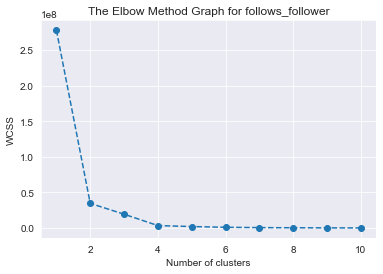

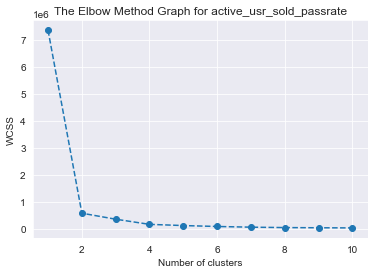

In [35]:
#elbow method to find the corrext number of cluseters in active users

wcss=[]
for i in range(1,11): 
    kmeans = KMeans(n_clusters=i, init ='k-means++', max_iter=50,  n_init=10,random_state=0 )
    kmeans.fit(active_usr_follows_follower)
    wcss.append(kmeans.inertia_)
#kmeans inertia_ attribute is:  Sum of squared distances of samples #to their closest cluster center.
#4.Plot the elbow graph
plt.plot(range(1,11),wcss, marker = 'o', linestyle = '--')
plt.title('The Elbow Method Graph for follows_follower')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


wcss3=[]
for i in range(1,11): 
    kmeans = KMeans(n_clusters=i, init ='k-means++', max_iter=50,  n_init=10,random_state=0 )
    kmeans.fit(active_usr_sold_passrate)
    wcss3.append(kmeans.inertia_)
#kmeans inertia_ attribute is:  Sum of squared distances of samples #to their closest cluster center.
#4.Plot the elbow graph
plt.plot(range(1,11),wcss3, marker = 'o', linestyle = '--')
plt.title('The Elbow Method Graph for active_usr_sold_passrate')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


In [46]:
#todo check why y_kmeans_auff is the graph, shoudl be something else
sns.scatterplot(active_usr_follows_follower[y_kmeans_auff==0, 0], active_usr_follows_follower[y_kmeans_auff==0, 1],s=50, c=['y'], label ='1 To improve', alpha = 0.8)
sns.scatterplot(active_usr_follows_follower[y_kmeans_auff==1, 0], active_usr_follows_follower[y_kmeans_auff==1, 1], s=75, c=['r'], label ='2 Low quality', alpha = 0.8)
sns.scatterplot(active_usr_follows_follower[y_kmeans_auff==2, 0], active_usr_follows_follower[y_kmeans_auff==2, 1], s=75, c=['c'], label ='3 Potential', alpha = 0.8)
sns.scatterplot(active_usr_follows_follower[y_kmeans_auff==3, 0], active_usr_follows_follower[y_kmeans_auff==3, 1], s=75, c=['b'], label ='4 Stars', alpha = 0.2)

#Plot the centroid. This time we're going to use the cluster centres  #attribute that returns here the coordinates of the centroid.
#plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=6, c='y', label = 'Centroids')
plt.title('Users with their followers/follows')
plt.xlabel('# follows')
plt.ylabel('# followers')
plt.show()


IndexError: boolean index did not match indexed array along dimension 0; dimension is 21639 but corresponding boolean dimension is 2036

In [ ]:
sns.scatterplot(active_usr_sold_passrate[y_kmeans_ausd==0, 0], active_usr_sold_passrate[y_kmeans_ausd==0, 1], s=75, c=['y'], label ='1 To improve', alpha = 0.2)
sns.scatterplot(active_usr_sold_passrate[y_kmeans_ausd==1, 0], active_usr_sold_passrate[y_kmeans_ausd==1, 1], s=75, c=['r'], label ='2 Low quality', alpha = 0.2)
sns.scatterplot(active_usr_sold_passrate[y_kmeans_ausd==2, 0], active_usr_sold_passrate[y_kmeans_ausd==2, 1], s=75, c=['c'], label ='3 Potential', alpha = 0.2)
sns.scatterplot(active_usr_sold_passrate[y_kmeans_ausd==3, 0], active_usr_sold_passrate[y_kmeans_ausd==3, 1], s=75, c=['b'], label ='4 Stars', alpha = 0.9)

#Plot the centroid. This time we're going to use the cluster centres  #attribute that returns here the coordinates of the centroid.
#plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=6, c='y', label = 'Centroids')
plt.title('Users with their sold/pass rate')
plt.xlabel('# of sales')
plt.ylabel('pass rate %')
plt.show() 

# same as above but with successful_sellers

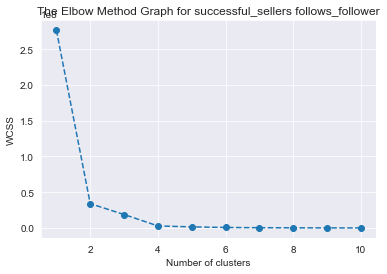

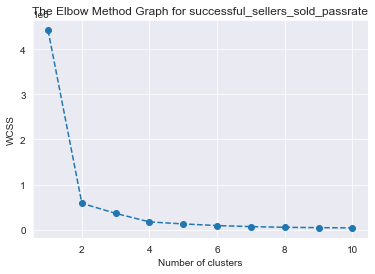

In [37]:
#elbow method to find the corrext number of cluseters in market_soc_df_follows_follower users

wcss_ss_ff=[]
for i in range(1,11): 
    kmeans = KMeans(n_clusters=i, init ='k-means++', max_iter=50,  n_init=10,random_state=0 )
    kmeans.fit(successful_sellers_follows_follower)
    wcss_ss_ff.append(kmeans.inertia_)
    
#kmeans inertia_ attribute is:  Sum of squared distances of samples #to their closest cluster center.
#4.Plot the elbow graph
plt.plot(range(1,11),wcss_ss_ff, marker = 'o', linestyle = '--')
plt.title('The Elbow Method Graph for successful_sellers follows_follower')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


wcss_ss_sp=[]
for i in range(1,11): 
    kmeans = KMeans(n_clusters=i, init ='k-means++', max_iter=50,  n_init=10,random_state=0 )
    kmeans.fit(successful_sellers_sold_passrate)
    wcss_ss_sp.append(kmeans.inertia_)
#kmeans inertia_ attribute is:  Sum of squared distances of samples #to their closest cluster center.
#4.Plot the elbow graph
plt.plot(range(1,11),wcss_ss_sp, marker = 'o', linestyle = '--')
plt.title('The Elbow Method Graph for successful_sellers_sold_passrate')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


In [38]:
#5 According to the Elbow graph we deterrmine the clusters number as #4
#Applying k-means algorithm to the active user dataset.
kmeans2 = KMeans(n_clusters=4, init ='k-means++', max_iter=300, n_init=10,random_state=0 )
# We are going to use the fit predict method that returns for each #observation which cluster it belongs to.
#The cluster to which #client belongs and it will return this cluster numbers into a #single vector that is  called y K-means
y_kmeans_auff = kmeans2.fit_predict(successful_sellers_follows_follower)
y_kmeans_ausd = kmeans2.fit_predict(successful_sellers_sold_passrate)

successful_sellers['Cluster'] = y_kmeans_ausd
successful_sellers["Cluster-ss-sp"] = y_kmeans_ausd

In [57]:
successful_sellers["Cluster-ss-sp"] = successful_sellers["Cluster-ss-sp"].astype(str)
fig = px.scatter(successful_sellers, x="productsSold", y="productsPassRate", color="Cluster-ss-sp", size='socialNbFollowers',
                #color_discrete_sequence=px.colors.qualitative.G10,
                color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"],
                )

fig.update_layout(
    title={
        'text': "Scatter plot of users with their number of follower as bubble size",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    legend_title="Cluster number"
)
#todo orca
fig.write_image("Output/scatter+cluster.png")
fig.show()

                            OLS Regression Results                            
Dep. Variable:           productsSold   R-squared:                       0.374
Model:                            OLS   Adj. R-squared:                  0.373
Method:                 Least Squares   F-statistic:                     1214.
Date:                Thu, 14 Mar 2024   Prob (F-statistic):          6.08e-209
Time:                        13:37:18   Log-Likelihood:                -7730.2
No. Observations:                2036   AIC:                         1.546e+04
Df Residuals:                    2034   BIC:                         1.548e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 1.8364      0.26

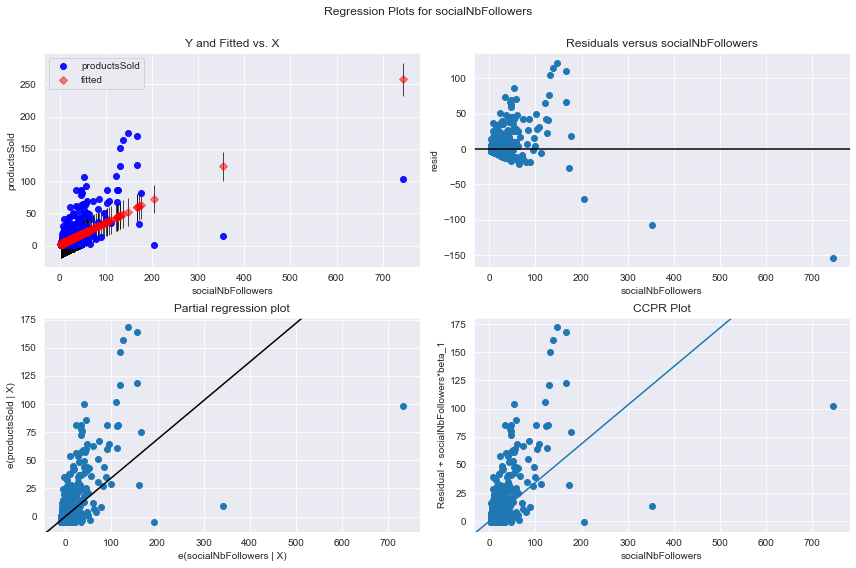

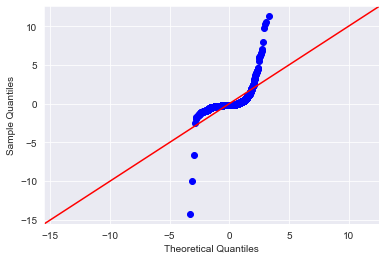

In [41]:
#check of logisti regressin?

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
import pandas as pd
from sklearn.linear_model import LinearRegression


import statsmodels.api as sm

#define response variable
y = successful_sellers['productsSold']

#define explanatory variable
x = successful_sellers['socialNbFollowers']

#add constant to predictor variables
x = sm.add_constant(x)

#fit linear regression model
model = sm.OLS(y, x).fit()

#view model summary
print(model.summary())

####
#define figure size
fig = plt.figure(figsize=(12,8))

#produce residual plots
fig = sm.graphics.plot_regress_exog(model, 'socialNbFollowers', fig=fig)

res = model.resid

#create Q-Q plot
fig = sm.qqplot(res, fit=True, line="45")
plt.show()

# checking the distribution of clusters

In [43]:
fig = px.histogram(data_frame=successful_sellers, x="Cluster-ss-sp", color = "Cluster-ss-sp", color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"],
             histfunc= 'count')


fig.update_layout(
    title={
        'text': "Amount of users for each cluster",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    legend_title="Cluster number",
        yaxis_title="Amount of users"
)
#fig.write_image("Output/distrib-cluster.png")
fig.show()

In [44]:
px.histogram(data_frame=successful_sellers, x="Cluster-ss-sp", y="productsSold", color = "Cluster-ss-sp", color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"],histfunc = 'sum')

fig.update_layout(
    title={
        'text': "Sum of item sold for each cluster",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    legend_title="Cluster number",
        yaxis_title="sum of item sold"
)
#fig.write_image("Output/distrib-cluster-sold.png")
fig.show()

In [45]:
colors = ["green", "goldenrod", "blue", "red", "magenta"]
colors2 = ["green", "goldenrod", "#0039dd", "red", "magenta"]


animals=['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']
test = successful_sellers['Cluster-ss-sp']

fig = go.Figure(data=[
    go.Bar(name='# of users', x=animals, y=[251, 1109, 627, 49],
           marker_color=colors, text = '# of users'),
    go.Bar(name='sum of sales', x=animals, y=[1715, 1436, 5111,3765],
          marker_color=colors2)
    
])

# Change the bar mode
fig.update_layout(barmode='group')

fig.update_layout(
    title={
        'text': "Amount of users and total of sales for each cluster",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title="Amount of users",
)
fig.update_layout(showlegend=False)


#fig.write_image("Output/cluster-sold.png")
fig.show()

In [ ]:
successful_sellers.groupby(['Cluster-ss-sp'])['socialNbFollowers'].hist()